# Artigo 2 - A group of turtles

## Objetivo
Para esse segundo artigo, o objetivo é ir um passo além do primeiro, tendo como objetivo criar uma nova inteligência artificial capaz de classificar imagens, que nesse caso, foi decidido que ela será treinada para conseguir classificar entre aves. Além da criação da IA em si, no final ela será disponibilizada na plataforma Hugging Face, sendo que para isso, ao longo do processo serão utilizados mais funções, que irão trazer a possibilidade de visualizar melhor os erros da IA e por consequência corrigi-los e assim conseguir chegar em um modelo bem treinado.

## Motivação
Analisar de qual tipo de ave é importante, mediante a saber por exemplo que tipo de dieta a ave especifica precisa.

## Requisitos
Para que se possa realizar a construção da IA precisa de duas coisas, primeiro, dos dados que serão usados tanto para treinar quanto para realizar o teste, que serão adquiridos usando a biblioteca **duckduckgo_search** e da criação da própria IA, que será feito através da biblioteca **fastai**, onde serão instalados na célula 01.

In [1]:
#Parâmetros:
#U - Serve para pegar a biblioteca atualizada
#qq - Serve para fazer toda a instalação em silêncio

!pip install -Uqq fastai
!pip install -Uqq duckduckgo_search

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.7/75.7 kB 8.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.0/76.0 kB 7.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.5/57.5 kB 6.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 10.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.3/58.3 kB 5.0 MB/s eta 0:00:00


## Dados
O próximo passo se da em conseguir os dados para fazer todo o treinamento da IA, para isso sera usado justamente a biblioteca instalada do DuckDuckGo para procurar as imagens, como mostrado na célula 02.

In [2]:
from duckduckgo_search import ddg_images
from fastcore.all import *

# A seguir se tem a função de pesquisa que recebe dois parâmetros:
# Tipo de imagem que esta sendo buscada
# Quantidade de imagem que esta sendo buscado

def search_imagens(term, max_images=300): return L(ddg_images(term, max_results=max_images)).itemgot('image')

Agora chegou o momento de testas para ver quais imagens o DuckDuckGo irá retornar, fazendo sua visualização usando uma biblioteca da fastai, onde os passos seguiram a sequência demostrada a seguir e podem ser visualizados na célula 03.

* search_imagens: Procura pelas imagens e retorna a Url
* download_url: Baixa a imagens passada pela Url achada pela função search
* Image.Open: Abre a Imagem para poder ser visualizada.

In [39]:
# Antes de se realziar esse processo, se deve importar as bibliotecas que serão usadas
from fastdownload import download_url
from fastai.vision.all import *

#Agora pode se executar o processo de baixar e visualizar as imagens.
crow = search_imagens('Crow', max_images=1)[0]
macaw = search_imagens('Macaw', max_images=1)[0]
cockatiel = search_imagens('Cockatiel', max_images=1)[0]

download_url(crow, 'Crow.jpg', show_progress=False)
download_url(macaw, 'Macaw.jpg', show_progress=False)
download_url(cockatiel, 'Cockatiel.jpg', show_progress=False)

Path('Cockatiel.jpg')

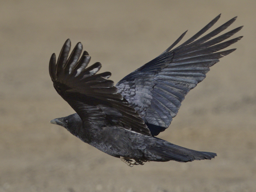

In [40]:
Image.open('Crow.jpg').to_thumb(256, 256)

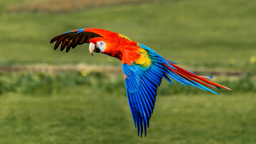

In [41]:
Image.open('Macaw.jpg').to_thumb(256, 256)

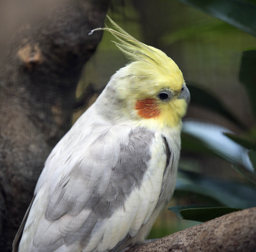

In [42]:
Image.open('Cockatiel.jpg').to_thumb(256, 256)

As buascas fornecem dados satisfatórios, porém para complicar para se ter um pouco mais de dados, serão pesquisadas imagens onde as aves estão comendo e dormindo.

Agora pode se começar a popular os dados que serão usados para treino e teste, salvando cada grupo em um diretório diferente. Sendo que será usado mais uma função, que é a sleep, onde ela é usada para poder evitar problemas no tráfego de imagens.

Como definido anteriormente, será pegado 300 de cada tipo de imagem, que pode ser observado na célula 07

In [44]:
from time import sleep

searchs = 'Crow', 'Macaw', 'Cockatiel'
path = Path('Aves_Speak')

for Aves_Speak in searchs:
    dest = (path/Aves_Speak)
    dest.mkdir(exist_ok=True, parents=True)
    download_images(dest, urls=search_imagens(f'{Aves_Speak}'))
    sleep(10)
    resize_images(path/Aves_Speak, max_size=400, dest=path/Aves_Speak) #Redimensionamento de todas as imagens

Agora antes que possamos treinar o modelo, é preciso verificar se houve algum erro ao baixar alguma imagens, e para isso é usado a função da célula 08 que caso encontre links com erro, irá descartar essas imagens.

In [45]:
failed = verify_images(get_image_files(path))
failed.map(Path.unlink)
len(failed)

14

## Treinamento do Modelo
Agora que todos os dados foram coletados e os prejudicados foram descartados, pode-se começar a treinar o modelo. Sendo que para isso, é necessário a criação de **DataLoaders** que é um objeto que vai especificar dois conjuntos, um de imagens usadas para treinamento do modelo e um para validação do modelo, e para a sua criação, será usada o **DataBlock** da biblioteca da **fastai**. Onde o processo pode ser observado na célula 09.

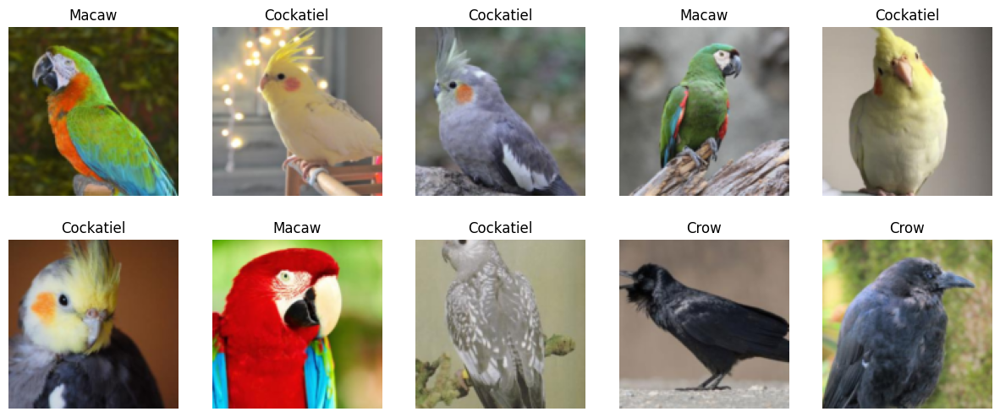

In [55]:
Aves_Speak = DataBlock(
    blocks=(ImageBlock, CategoryBlock), # Específica que a entrada são imagens e a saída são elas categorizadas
    get_items=get_image_files,  # Retorna uma lista de todas as imagens
    splitter=RandomSplitter(valid_pct=0.2, seed=42), # Divisão dos conjuntos de treinamento e de validação = 80%/20%
    get_y=parent_label, # Adiciona a label conforme a pasta que está a imagem
    item_tfms=Resize(128) # Redimensionando as Imagens
)

dls = Aves_Speak.dataloaders(path) # Carregandoas imagens
dls.valid.show_batch(max_n=10, nrows=2) # Mostrando os dados categorizados

### Variações de Dados
Para aumentar ainda mais os dados que existem, pode-se criar variações dos mesmos, para que se aumenta a base de dados mas sem alterar o significado de cada um deles, e nem mesmo salvando elas, uma vez que elsas serão transformadas mas armazenadas em memória ram, e para isso existem diversas técnicas, nesse caso, será aplicado a de **RandomResizedCrop** e de **Aug_Transforms**.

Como pode ser observado na célula 10

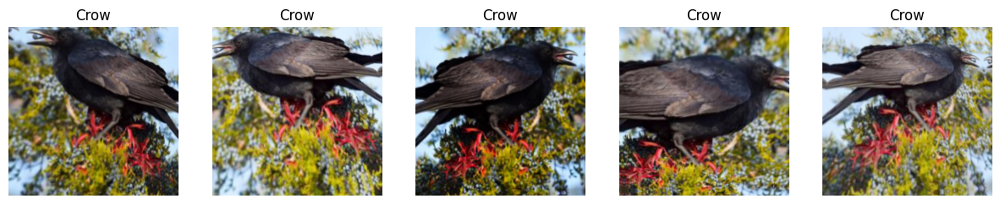

In [56]:
Aves_Speak = Aves_Speak.new(item_tfms=RandomResizedCrop(224, min_scale=0.5), batch_tfms=aug_transforms())
dls = Aves_Speak.dataloaders(path)
dls.train.show_batch(max_n=5, nrows=1, unique=True)

Para o próximo passo é necessário criar o modelo, para isso será usado o modelo de visão computacional **resnet18**, que é um modelo rápido e amplamente utilizado, sendo que para isso sera usado também a função fine_tune() da fastai que já irá ajustar um modelo pré-treinado utilizando as melhores práticas.

Isso significado que será partido do princípio de um modelo que alguém treinou usando um conjunto de dados e será ajustado os pesos para que se possa se adequar ao conjunto de dados que se deseja usar.

Esse processo pode ser visto na célula 11, onde foram usados três treinamentos, isso para que se possa atingir uma boa precisão, além de parar nesse momento ajuda a ter um modelo treinado e não um decorado.

In [48]:
learn = vision_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(3)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


epoch,train_loss,valid_loss,error_rate,time
0,1.654454,0.081709,0.031250,00:03


epoch,train_loss,valid_loss,error_rate,time
0,0.343732,0.027584,0.015625,00:02
1,0.218853,0.017315,0.015625,00:01
2,0.146984,0.016034,0.015625,00:02


Como pode ser observado, o modelo atingiu uma boa precisão, mas para poder avaliar melhor que erro ele cometeu, é possível se olhar a matriz de confusão e entender o que está acontecendo, presente na célula 12.

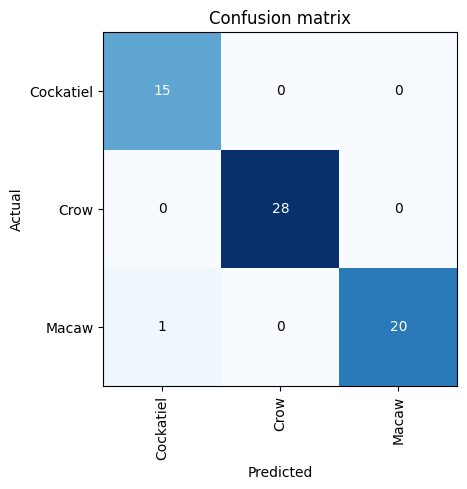

In [49]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

Nesse caso, pode se observar que existiu uma confusão, como o modelo ter classificado uma arara como calopsita. Para melhor visualização pode-se dar uma olhada nessa imagem através de uma função, presente na célula 13.

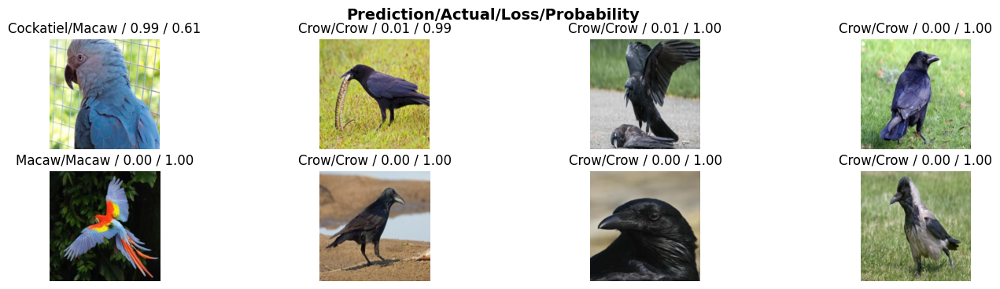

In [50]:
interp.plot_top_losses(8, nrows=2, figsize=(17, 4))

Agora é possível se realizar uma limpeza no modelo, onde aqueles dados classificados incorretamente podendo ser removidos ou reajustado sua label. So que antes para essa tarefa é necessário importar a função que irá permiter a execução dessa atividade da biblioteca **fastai**.Essa tarefa pode ser observada na célula 14.

In [51]:
from fastai.vision.widgets import *

cleaner = ImageClassifierCleaner(learn)
cleaner

Depois de marcar a ação que deve acontecer com cada um dos itens marcados, começa o processo de realizar as ações sobre eles criando um novo data base com as correções implementadas, no caso, a imagem que gerou dúvdas será excluída. Todo o processo pode ser obsrevado na célula 15.

In [52]:
for idx in cleaner.delete(): cleaner.fns[idx].unlink()
for idx,cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]), path/cat)

Agora pode-se criar novamente o DataBlock e treinar o modelo, como demostrado na célula 16 e 17.

In [57]:
Aves_Speak = Aves_Speak.new(item_tfms=RandomResizedCrop(224, min_scale=0.5), batch_tfms=aug_transforms())
dls = Aves_Speak.dataloaders(path)

In [58]:
learn = vision_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(3)

epoch,train_loss,valid_loss,error_rate,time
0,1.573630,0.097239,0.015625,00:02


epoch,train_loss,valid_loss,error_rate,time
0,0.244767,0.022663,0.000000,00:01
1,0.140326,0.004899,0.000000,00:02
2,0.097737,0.002533,0.000000,00:02


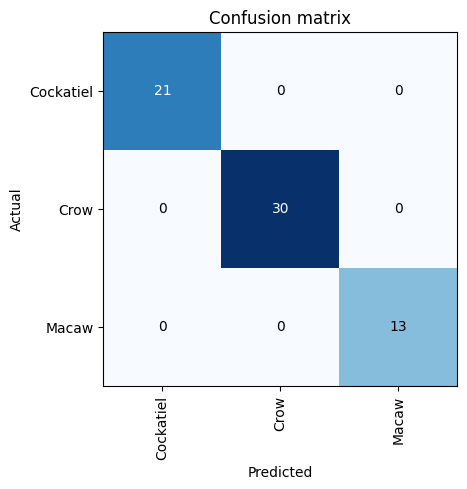

In [59]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

Com isso temos um modelo bem treinado e pronto para ser levado para a produção.

## Deploy
Para realizar o deploy o modelo será exportado como demostrado na célula 18 e será feito o upload no site do Huggingface

In [60]:
learn.export("modelo.pkl")

O deploy pode ser encontrado no link [Aves Speak](https://huggingface.co/spaces/fastaioncampus/Aves_Speak)

## Bibliografia
[1] [Deployment](https://course.fast.ai/Lessons/lesson2.html)